## Setup

In [1]:
!git clone https://github.com/huggingface/diffusers
%pip install git+https://github.com/huggingface/diffusers
%pip install triton
%pip install accelerate transformers ftfy gradio natsort safetensors
%pip install bitsandbytes
!pip install torch
!pip install pillow
!pip install xformers
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux
!pip install peft
#!pip install requests
!pip install git+https://github.com/huggingface/accelerate.git
!wget -O civitai_midel.ckpt https://civitai.com/api/download/models/201259?type=Model&format=SafeTensor&size=pruned&fp=fp16
!wget https://raw.githubusercontent.com/CompVis/stable-diffusion/main/configs/stable-diffusion/v1-inference.yaml

Cloning into 'diffusers'...
remote: Enumerating objects: 61100, done.
remote: Counting objects: 100% (14282/14282), done.
remote: Compressing objects: 100% (1070/1070), done.
remote: Total 61100 (delta 13821), reused 13249 (delta 13197), pack-reused 46818
Receiving objects: 100% (61100/61100), 41.48 MiB | 25.06 MiB/s, done.
Resolving deltas: 100% (44838/44838), done.
  Cloning https://github.com/huggingface/diffusers to /tmp/pip-req-build-bge8_9mh
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/diffusers /tmp/pip-req-build-bge8_9mh
  Resolved https://github.com/huggingface/diffusers to commit b8ccb462596d336ce892e329ba69fa12394e9964
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for diffusers: filename=diffusers-0.28.0.dev0-py3-none-any.whl size=2097023 sha256=56bf157498e1f5a5319d116472235af773ebc2223f32d1afee6637523c94b5f3
  Stored in directory:

In [2]:
import os
import requests
from shutil import copyfileobj
# from google.colab import files, drive
from PIL import Image
import cv2
import numpy as np

import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler, StableDiffusionControlNetPipeline, UniPCMultistepScheduler
from diffusers.utils import load_image
from IPython.display import display

import peft 

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

2024-04-30 18:33:27.566733: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 18:33:27.566836: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 18:33:27.692586: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
!pip list | grep torch

pytorch-ignite                           0.5.0.post2
pytorch-lightning                        2.2.2
torch                                    2.3.0
torchaudio                               2.1.2
torchdata                                0.7.1
torchinfo                                1.8.0
torchmetrics                             1.3.2
torchtext                                0.16.2
torchvision                              0.16.2


In [4]:
!python diffusers/scripts/convert_original_stable_diffusion_to_diffusers.py \
      --checkpoint_path='/kaggle/input/cvtai/other/1/1/epicphotogasm_zUniversal.safetensors'\
      --original_config_file='/kaggle/working/v1-inference.yaml'\
      --dump_path='/kaggle/working/cache_dir/models/civitai_model'\
      --scheduler_type="ddim" --prediction_type='epsilon'\
      --from_safetensors

2024-04-30 18:33:47.719602: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 18:33:47.719668: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 18:33:47.721318: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
config.json: 100%|█████████████████████████| 4.52k/4.52k [00:00<00:00, 14.4MB/s]
tokenizer_config.json: 100%|███████████████████| 905/905 [00:00<00:00, 4.44MB/s]
vocab.json: 100%|████████████████████████████| 961k/961k [00:00<00:00, 3.90MB/s]
merges.txt: 100%|████████████████████████████| 525k/525k [00:00<00:00, 2.13MB/s]
special_tokens_map.json: 100%|███████████

In [5]:
# drive.mount('/content/drive')
# !cp -r /content/cache_dir/models/civitai_model/ /content/drive/MyDrive/

''' url = 'https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora.py'
r = requests.get(url)
with open('train_dreambooth_lora.py', 'w') as f:
    f.write(r.text)
#import train_dreambooth_lora as tl '''

" url = 'https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora.py'\nr = requests.get(url)\nwith open('train_dreambooth_lora.py', 'w') as f:\n    f.write(r.text)\n#import train_dreambooth_lora as tl "

## Data

In [6]:
if not os.path.exists('/kaggle/working/data'):
    os.makedirs('/kaggle/working/data')

def download_image(url, destination):
    response = requests.get(url, stream=True)
    if response.status_code == 200:
        with open(destination, 'wb') as file:
            copyfileobj(response.raw, file)
    else:
        print(f"Failed to download image from {url}")

In [7]:
if not os.path.exists('/kaggle/working/output_sd'):
    os.makedirs('/kaggle/working/output_sd')

In [8]:
urls = ['https://th.bing.com/th/id/OIP.2hBjcfycMBrbaPnL3wXu8gHaE8?rs=1&pid=ImgDetMain', 'https://th.bing.com/th/id/R.3e2bd135692331de02d86b52fcf7b275?rik=O7lPjYvnwsODwA&pid=ImgRaw&r=0', 'https://th.bing.com/th/id/R.8e1bc3aae2d737df41d876b272382eaa?rik=dKXjcqMd8KgCcQ&riu=http%3a%2f%2fwww.trussvilletribune.com%2fwp-content%2fuploads%2f2017%2f09%2fct-donald-trump-stupid-president-20170531.jpg&ehk=OhcPiDeTW%2bwYaA2bmKh1PnAX8UDY7y93P6ASzSrH%2bTE%3d&risl=&pid=ImgRaw&r=0',
        'https://static01.nyt.com/images/2019/09/10/opinion/10bruniWeb/10bruniWeb-superJumbo.jpg?quality=90&auto=webp', 'https://th.bing.com/th/id/OIP.UfrbIgUcA723drH6oIsVkAAAAA?rs=1&pid=ImgDetMain', 'https://i0.wp.com/us-east-1.linodeobjects.com/gunaxin/2019/04/Trump.jpg?fit=1291,1291&ssl=1',
        'https://mediaproxy.salon.com/width/1200/https://media.salon.com/2020/11/donald-trump-1123202.jpg', 'https://d.newsweek.com/en/full/1289369/president-donald-trump.jpg', 'https://th.bing.com/th/id/OIP.JxymTxgdNKMN7zf8gpLquwAAAA?rs=1&pid=ImgDetMain',
        'https://th.bing.com/th/id/R.8ae357a671fdede9aae087afcdaef8ed?rik=zJPKrpeWjV%2fBLA&riu=http%3a%2f%2fwp.production.patheos.com%2fblogs%2fjappersandjanglers%2ffiles%2f2016%2f02%2fDonald_Trump_August_2015.jpg&ehk=kRGzsWqJUHd7a1MRaU0Ujtf%2bct2H0WzI4L8iBk5PDgo%3d&risl=1&pid=ImgRaw&r=0', 'https://static.standard.co.uk/s3fs-public/thumbnails/image/2019/09/30/11/DonaldTrump3009a.jpg', 'https://th.bing.com/th/id/R.bd0d97016599feac2964e758f696116a?rik=ar%2bgIVkQ3dUaGg&riu=http%3a%2f%2fmedia.al.com%2fnews_impact%2fphoto%2fdonald-trump-684c376f6a658f7c.jpg&ehk=%2fk9v46JmmABW1GqUtDyNfODrHfdy1tjzfIBtNGBciJw%3d&risl=&pid=ImgRaw&r=0',
        'https://th.bing.com/th/id/R.bbd7208dd5a2ad77468829e14b135523?rik=QsZoZ%2f4tL6Ywbw&riu=http%3a%2f%2fmedia.advance.net%2fpolitics_news_national_desk%2fphoto%2fdonald-trump-b19c8bfd95bf47df.jpg&ehk=RwrCtWiKGFmqNidq4J1Oe7ZxSZG6Tfcam%2bc3UT4HAJI%3d&risl=&pid=ImgRaw&r=0', 'https://mediaproxy.salon.com/width/1200/https://media.salon.com/2016/05/donald_trump132.jpg', 'https://thesunflower.com/wp-content/uploads/2016/11/Trump45th.jpg',
        'https://i0.wp.com/thexplorion.com/wp-content/uploads/2020/09/Donald-Trump-scaled-1.jpg?w=2560&ssl=1', 'https://th.bing.com/th/id/R.fa723c6c99a985ecea8952644358d43a?rik=jnr%2fHgyQtX7xAQ&riu=http%3a%2f%2fupload.wikimedia.org%2fwikipedia%2fcommons%2fe%2fee%2fDonald_Trump_by_Gage_Skidmore.jpg&ehk=3SX1oikep4EofGgeIxaSxhxn5jCr3G0rbN6qeMT%2bmZM%3d&risl=1&pid=ImgRaw&r=0', 'https://th.bing.com/th/id/OIP.5tI0yA0QfTUnR6bVrC2tKAHaE7?rs=1&pid=ImgDetMain',
        'https://static.billboard.com/files/media/02-donald-trump-jan-press-conference-2017-billboard-1548-compressed.jpg', 'https://th.bing.com/th/id/OIP.EpmdjXj44XAVCfyLAOxehQAAAA?rs=1&pid=ImgDetMain', 'https://www.thefamouspeople.com/profiles/images/donald-trump-10.jpg',
        'https://www.gannett-cdn.com/presto/2019/02/13/USAT/6b7a8c4b-11ed-416a-9c8a-c8eeca76441a-EPA_USA_TRUMP_WHITE_HOUSE_2.JPG?crop=5183,2915,x1,y259&width=3200&height=1680&fit=bounds', 'https://www.sott.net/image/s28/573063/full/president_donald_trump.jpg', 'https://th.bing.com/th/id/OIP.8Idf1Roilu2HkpPuiTcdMgAAAA?rs=1&pid=ImgDetMain',
        'https://th.bing.com/th/id/OIP.kLDNE0qwRbBTM7QWj9j4FAAAAA?rs=1&pid=ImgDetMain', 'https://th.bing.com/th/id/R.3b90b49abb7d9c3c63ff59cae2a9f3b6?rik=LIhSRxyZNZi%2fYg&riu=http%3a%2f%2fcbsnews1.cbsistatic.com%2fhub%2fi%2f2016%2f12%2f27%2f0bdd3d20-ff41-45ef-bc71-7711a3d22540%2ftrump.jpg&ehk=WdB9LpOlukT7ceXiiyxJh0cHzYe5%2fUrFFGeJk9EeSTM%3d&risl=&pid=ImgRaw&r=0', 'https://static.politico.com/e9/06/031ab3b1406fb076ba8866a93748/150904-donald-trump-2-gty-629.jpg',
        'https://img.washingtonpost.com/rw/2010-2019/WashingtonPost/2016/02/01/Editorial-Opinion/Images/250663066_4.jpg?uuid=WGqwrskyEeWnslovgksCyQ', 'https://d.newsweek.com/en/full/485398/donald-trump.jpg', 'https://static01.nyt.com/images/2016/10/25/us/25TRUMPTAPES1/25TRUMPTAPES1-superJumbo.jpg',
        'https://d.newsweek.com/en/full/635470/donald-trump.jpg', 'https://img.etimg.com/photo/msid-83054761/Donald%20Trump.jpg', 'https://th.bing.com/th/id/OIP.eLn7RWUCqJi7S_3lMdu-4wAAAA?rs=1&pid=ImgDetMain',
        'https://cloudfront-us-east-2.images.arcpublishing.com/reuters/M3WJEQDT75MHTC6OWAOB7DPAI4.jpg', 'https://th.bing.com/th/id/OIP.-gsuwTx5STfjlyGHg9_FcwHaE3?w=640&h=420&rs=1&pid=ImgDetMain', 'https://cdn.cnn.com/cnnnext/dam/assets/161128072443-01-trump-1128-super-tease.jpg',
        'https://www.thenation.com/wp-content/uploads/2016/10/Trump_Donald_Debate_ap_img.jpg', 'https://th.bing.com/th/id/OIP.7IrIy2EAhn03waUAbInCBAHaE8?rs=1&pid=ImgDetMain', 'https://mediaproxy.salon.com/width/960/https://media.salon.com/2017/08/donald-trump60.jpg',
        'https://th.bing.com/th/id/OIP.4wcUv4t8WIkLnSm5gLnEsgHaE8?rs=1&pid=ImgDetMain', 'https://static.independent.co.uk/s3fs-public/thumbnails/image/2017/11/23/15/donald-trump.jpg', 'https://mediaproxy.salon.com/width/1200/https://media.salon.com/2016/04/donald_trump129.jpg',
        'https://www.thenation.com/wp-content/uploads/2017/04/Donald_Trump_CC_img.jpg?scale=896&compress=80', 'https://d.newsweek.com/en/full/694860/rtx341qy.jpg', 'https://www.michaeltyler.co.uk/wp-content/uploads/2016/03/donald-trump-e1461655495762.jpg']

for enum, url in enumerate(urls):
    destination = os.path.join('/kaggle/working', f'pic_{enum}.jpg')
    download_image(url, destination)

In [9]:
dataroot = "/kaggle/input/trump-brime-trimmed"

## Stable diffusion 1.5

In [10]:
if not os.path.exists('/kaggle/working/class_data_dir'):
    os.makedirs('/kaggle/working/class_data_dir')

os.environ['INSTANCE_DIR'] = "/kaggle/input/trump-brime-trimmed"
os.environ['CLASS_DIR'] = "/kaggle/working/class_data_dir"

os.environ['MODEL_NAME'] = "/kaggle/working/cache_dir/models/civitai_model/"
os.environ['OUTPUT_DIR'] = "/kaggle/working/output_sd"

In [11]:
!python3 /kaggle/working/diffusers/examples/dreambooth/train_dreambooth.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --output_dir=$OUTPUT_DIR \
  --class_data_dir=$CLASS_DIR \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face " \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=2e-6 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=800 \
  --checkpointing_steps=800 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --train_text_encoder

/opt/conda/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/opt/conda/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2024-04-30 18:35:04.132016: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 18:35:04.132083: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 18:35:04.133877: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:

In [12]:
model_path = os.environ['OUTPUT_DIR']

pipe = StableDiffusionPipeline.from_pretrained(model_path, safety_checker=None, torch_dtype=torch.float16).to("cuda")
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
g_cuda=None

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [13]:
g_cuda = torch.Generator(device='cuda')
seed = 345252
g_cuda.manual_seed(seed)

  0%|          | 0/35 [00:00<?, ?it/s]

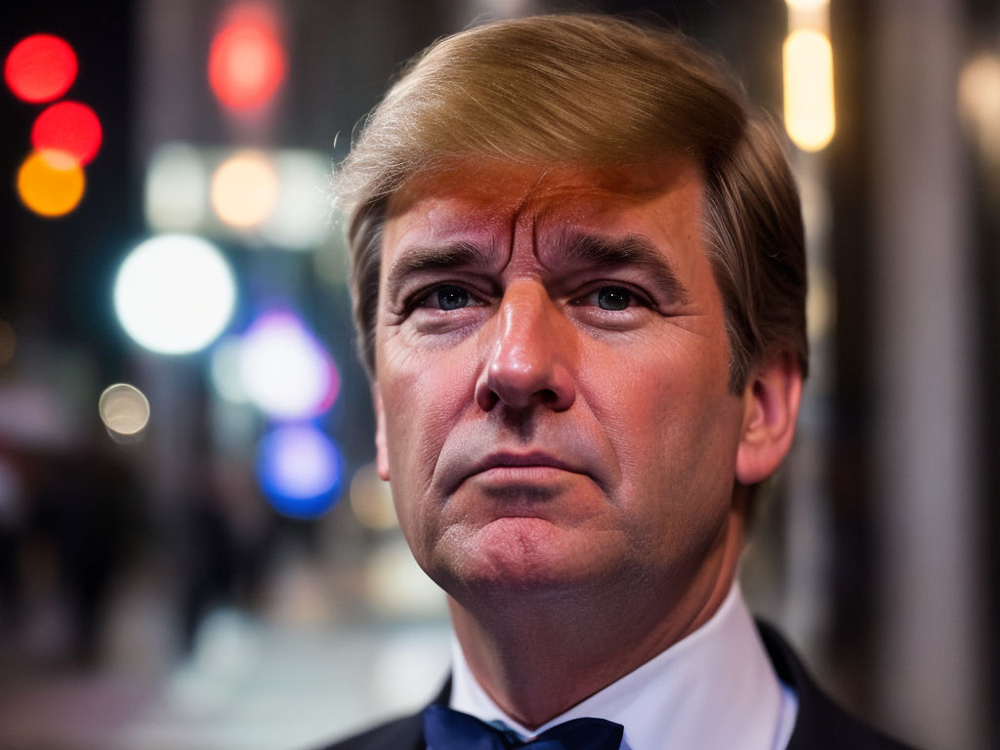

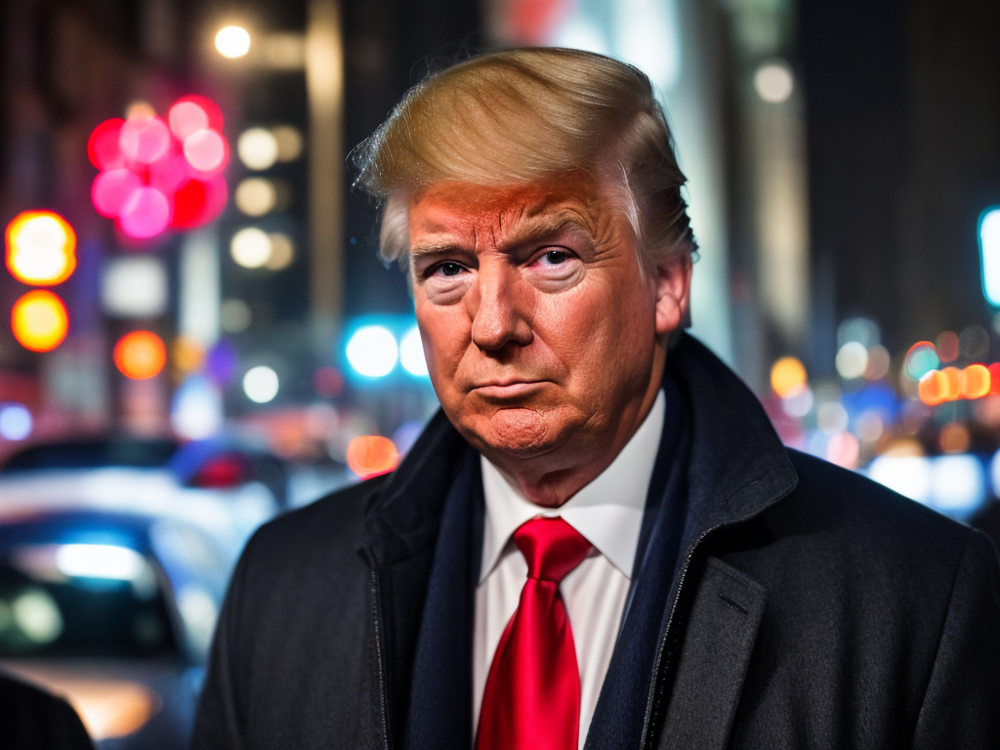

In [14]:
prompt = "portrait of sks man face, on the street, lights, midnight, NY, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  sarcastic eyes, detailed eyes, ironic expression"
negative_prompt = "deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands disconnected limbs, mutation, ugly, blurry, amputation"
num_samples = 2
guidance_scale = 7.5
num_inference_steps = 35
height = 768
width = 1024

with autocast("cuda"), torch.inference_mode():
    images = pipe(
        prompt,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images

for img in images:
    display(img)

In [15]:
token = "sks"
promt_list = [
    {
     "name": "kitchen",
     "prompt":f"close up portrait of {token} man face, in the kitchen, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus",
     "n_prompt":"naked, nsfw, deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands disconnected limbs, mutation, ugly, blurry, amputation",
    },
    {
     "name": "forest",
     "prompt":f"portrait of {token} man face, in the forest, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus",
     "n_prompt":"naked, nsfw, deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands disconnected limbs, mutation, ugly, blurry, amputation",
    },
    {
     "name": "street",
     "prompt":f"portrait of {token} man face, on the street, lights, midnight, NY, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes",
     "n_prompt":"naked, nsfw, deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands, mutation, ugly, blurry",
    },
    {
     "name": "anime",
     "prompt":f"portrait of {token} man face, anime style, japan, midnight, Tokyo, standing, 4K, raw, hrd, hd, high quality, sharp focus, detailed eyes",
     "n_prompt":"naked, nsfw, deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands, mutation, ugly, blurry",
    },
    {
     "name": "classicist art",
     "prompt":f"portrait of {token} man face, classic art style, medieval europe, moonlight, standing, 4K, raw, hrd, hd, high quality, sharp focus, detailed eyes",
     "n_prompt":"naked, nsfw, deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands, mutation, ugly, blurry",
    },
]

def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [16]:
seed = 1666
repeat = 2
num_samples = 2
guidance_scale = 7.5
num_inference_steps = 35
height = 768
width = 1024


if not os.path.exists('/kaggle/working/output_pics_sd'):
    os.makedirs('/kaggle/working/output_pics_sd')

save_folder = "/kaggle/working/output_pics_sd"
save_mode = "with_train_token"
# save_mode = "base_model"

In [17]:
for idx, sample in enumerate(promt_list):
    prompt = sample.get("prompt")
    negative_prompt = sample.get("n_prompt")
    name = sample.get("name")
    image_list = []
    for _ in range(repeat):
        generator = g_cuda
        with autocast("cuda"), torch.inference_mode():
            images = pipe(
                prompt,
                height=height,
                width=width,
                negative_prompt=negative_prompt,
                num_images_per_prompt=num_samples,
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator
            ).images
        image_list.extend(images)
        seed+=345324
    img_grid = image_grid(image_list, num_samples, repeat)
    save_path = os.path.join(save_folder, save_mode, f"{height}x{width}")
    os.makedirs(save_path, exist_ok=True)
    img_grid.save(os.path.join(save_path, f"{name}.jpg"))

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

In [20]:
if not os.path.exists('/kaggle/working/class_data_lora'):
    os.makedirs('/kaggle/working/class_data_lora')

if not os.path.exists('/kaggle/working/output_lora_1'):
    os.makedirs('/kaggle/working/output_lora_1')
if not os.path.exists('/kaggle/working/output_lora_2'):
    os.makedirs('/kaggle/working/output_lora_2')
if not os.path.exists('/kaggle/working/output_lora_3'):
    os.makedirs('/kaggle/working/output_lora_3')

# os.environ['INSTANCE_DIR'] = "/kaggle/working/data_cr"
os.environ['CLASS_DIR_LORA'] = "/kaggle/working/class_data_lora"

# os.environ['MODEL_NAME'] = "/kaggle/working/cache_dir/models/civitai_model/"
os.environ['OUTPUT_DIR_LORA_1'] = "/kaggle/working/output_lora_1"
os.environ['OUTPUT_DIR_LORA_2'] = "/kaggle/working/output_lora_2"
os.environ['OUTPUT_DIR_LORA_3'] = "/kaggle/working/output_lora_3"

In [21]:
torch.cuda.empty_cache()

In [22]:
!python3 /kaggle/working/diffusers/examples/dreambooth/train_dreambooth_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --class_data_dir=$CLASS_DIR \
  --output_dir=$OUTPUT_DIR_LORA_1 \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face " \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=1111 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=5e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=800 \
  --checkpointing_steps=800 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --train_text_encoder \
  --rank=4

/opt/conda/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/opt/conda/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2024-04-30 20:45:10.565688: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 20:45:10.565748: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 20:45:10.567419: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:

In [23]:
!python3 /kaggle/working/diffusers/examples/dreambooth/train_dreambooth_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --output_dir=$OUTPUT_DIR_LORA_2 \
  --class_data_dir=$CLASS_DIR \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face " \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=1111 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=5e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=800 \
  --checkpointing_steps=800 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --train_text_encoder \
  --rank=8

/opt/conda/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/opt/conda/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2024-04-30 21:00:24.250090: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 21:00:24.250150: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 21:00:24.251723: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:

In [24]:
!python3 /kaggle/working/diffusers/examples/dreambooth/train_dreambooth_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --output_dir=$OUTPUT_DIR_LORA_3 \
  --class_data_dir=$CLASS_DIR \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face " \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=1111 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=5e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=800 \
  --checkpointing_steps=800 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --train_text_encoder \
  --rank=24

/opt/conda/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/opt/conda/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2024-04-30 21:15:11.615169: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-30 21:15:11.615224: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-30 21:15:11.616822: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:

In [25]:
def lora_infer(model_path, weights, save_folder, seed):
    pipe = StableDiffusionPipeline.from_pretrained(model_path, safety_checker=None, torch_dtype=torch.float16).to("cuda")
    pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
    pipe.load_lora_weights(weights)
    g_cuda=None
    
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    save_folder = save_folder
    save_mode = "with_train_token"
    for idx, sample in enumerate(promt_list):
        prompt = sample.get("prompt")
        negative_prompt = sample.get("n_prompt")
        name = sample.get("name")
        image_list = []
        for _ in range(repeat):
            generator = torch.Generator("cuda").manual_seed(seed)
            with autocast("cuda"), torch.inference_mode():
                images = pipe(
                prompt,
                height=height,
                width=width,
                negative_prompt=negative_prompt,
                num_images_per_prompt=num_samples,
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator
                ).images
            image_list.extend(images)
            seed+=345324
        img_grid = image_grid(image_list, num_samples, repeat)
        save_path = os.path.join(save_folder, save_mode, f"{height}x{width}")
        os.makedirs(save_path, exist_ok=True)
        img_grid.save(os.path.join(save_path, f"{name}.jpg"))

In [26]:
import safetensors

In [27]:
pt_state_dict1 = safetensors.torch.load_file('/kaggle/working/output_lora_1/pytorch_lora_weights.safetensors', device="cuda:0")
torch.save(pt_state_dict1, "/kaggle/working/output_lora_1/lora_weights_1.bin")
pt_state_dict2 = safetensors.torch.load_file('/kaggle/working/output_lora_2/pytorch_lora_weights.safetensors', device="cuda:0")
torch.save(pt_state_dict2, "/kaggle/working/output_lora_2/lora_weights_2.bin")
pt_state_dict3 = safetensors.torch.load_file('/kaggle/working/output_lora_3/pytorch_lora_weights.safetensors', device="cuda:0")
torch.save(pt_state_dict3, "/kaggle/working/output_lora_3/lora_weights_3.bin")

In [28]:
seed = 1111

model_path = "/kaggle/working/output_sd"

weights1 = "/kaggle/working/output_lora_1/lora_weights_1.bin"
weights2 = "/kaggle/working/output_lora_2/lora_weights_2.bin"
weights3 = "/kaggle/working/output_lora_3/lora_weights_3.bin"

save_folder1 = '/kaggle/working/output_pics_lora_rank_4'
save_folder2 = '/kaggle/working/output_pics_lora_rank_8'
save_folder3 = '/kaggle/working/output_pics_lora_rank_24'


lora_infer(model_path, weights1, save_folder1, seed)
lora_infer(model_path, weights1, save_folder2, seed)
lora_infer(model_path, weights2, save_folder3, seed)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

## Unet vs. Lora comparison

In [29]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

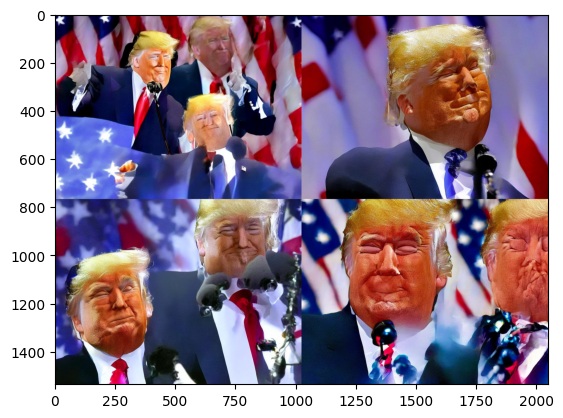

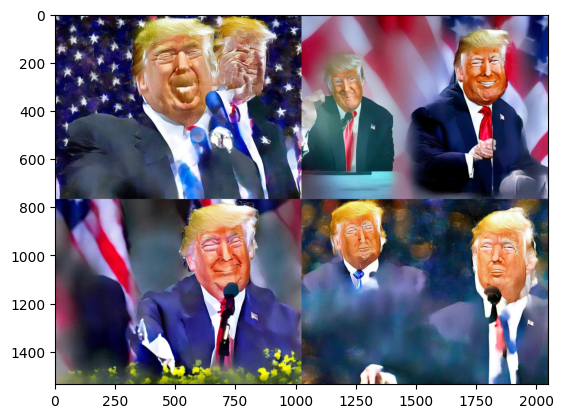

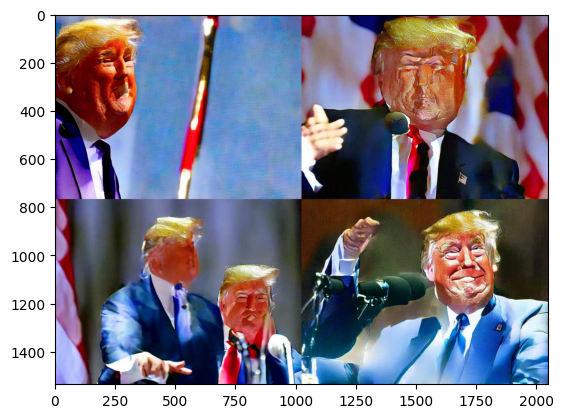

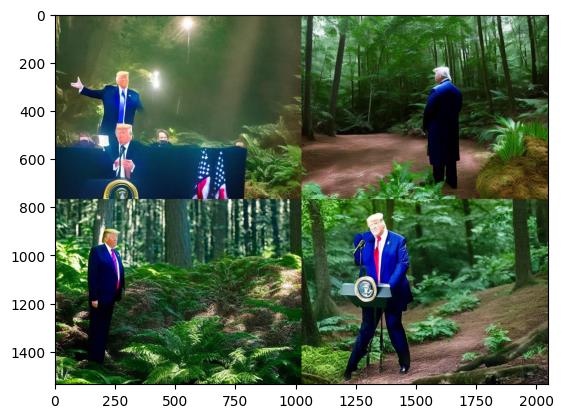

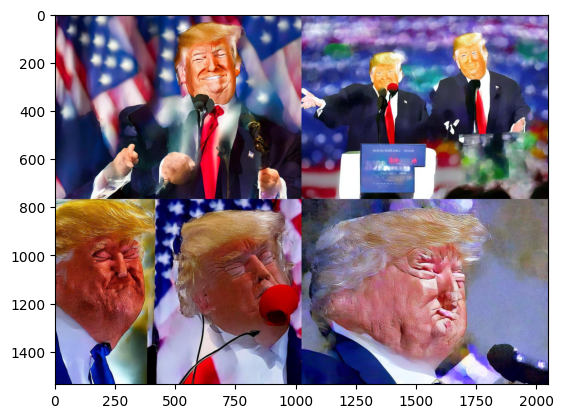

In [30]:
# Lora rank 4
folder = '/kaggle/working/output_pics_lora_rank_4/with_train_token/768x1024'
pics = ['classicist art.jpg', 'street.jpg', 'kitchen.jpg', 'forest.jpg', 'anime.jpg']
for pic in pics:
    pic_path = os.path.join(folder, pic)
    img = mpimg.imread(pic_path)
    imgplot = plt.imshow(img)
    plt.show()

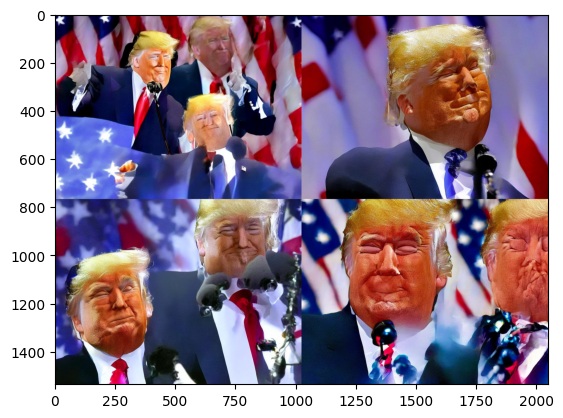

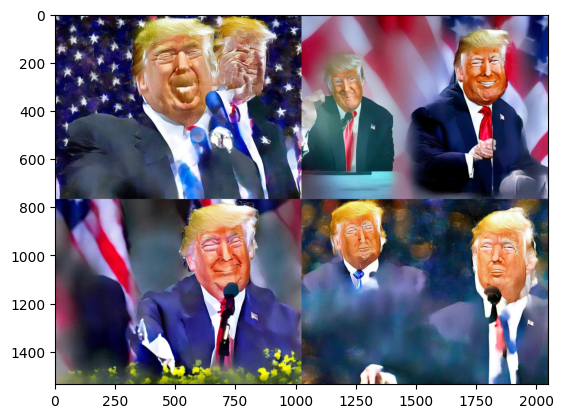

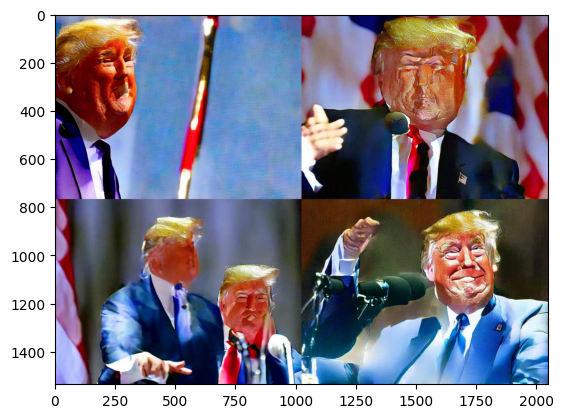

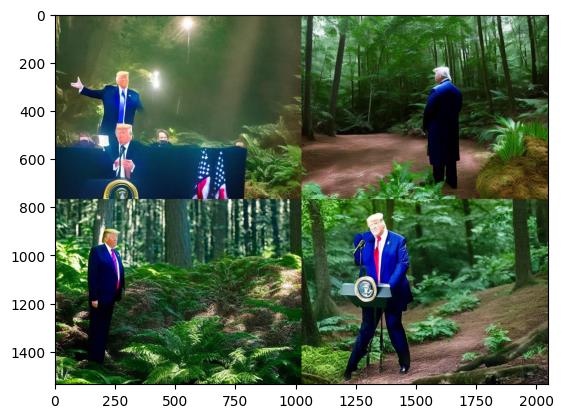

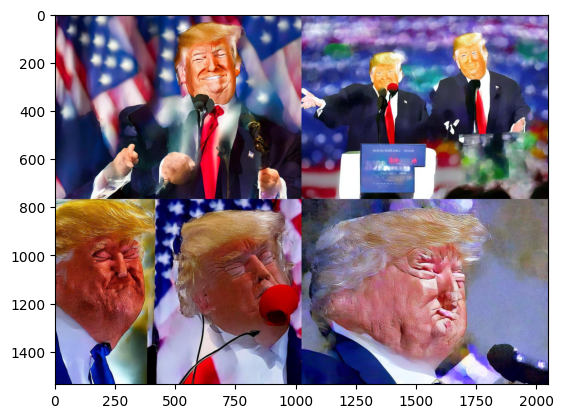

In [31]:
# Lora rank 8
folder = '/kaggle/working/output_pics_lora_rank_8/with_train_token/768x1024'
pics = ['classicist art.jpg', 'street.jpg', 'kitchen.jpg', 'forest.jpg', 'anime.jpg']
for pic in pics:
    pic_path = os.path.join(folder, pic)
    img = mpimg.imread(pic_path)
    imgplot = plt.imshow(img)
    plt.show()

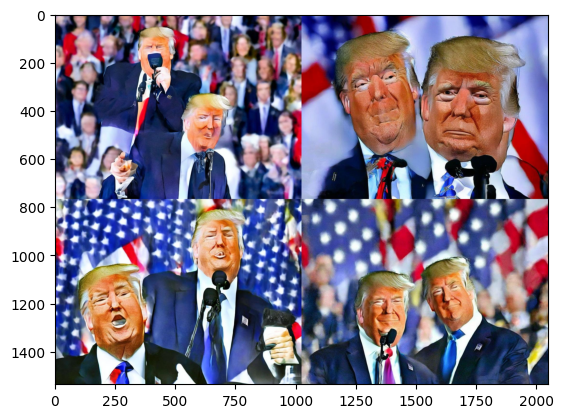

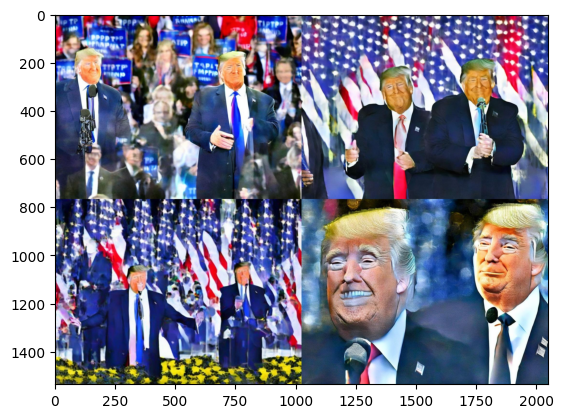

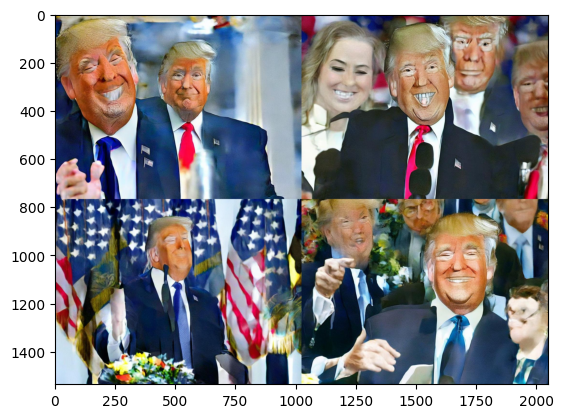

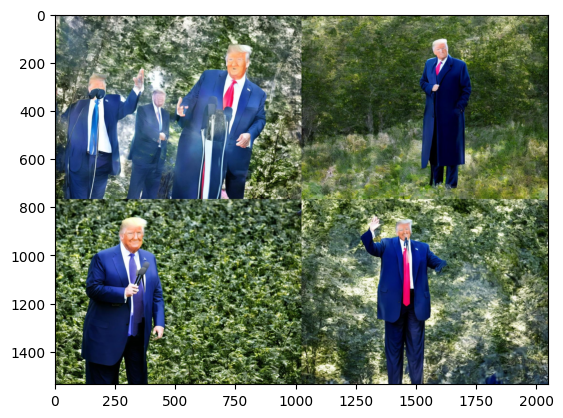

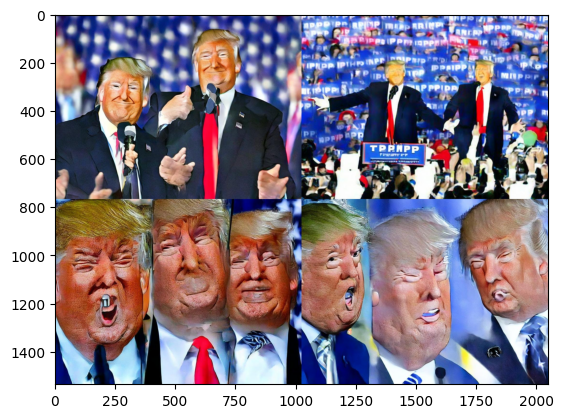

In [32]:
# Lora rank 24
folder = '/kaggle/working/output_pics_lora_rank_24/with_train_token/768x1024'
pics = ['classicist art.jpg', 'street.jpg', 'kitchen.jpg', 'forest.jpg', 'anime.jpg']
for pic in pics:
    pic_path = os.path.join(folder, pic)
    img = mpimg.imread(pic_path)
    imgplot = plt.imshow(img)
    plt.show()

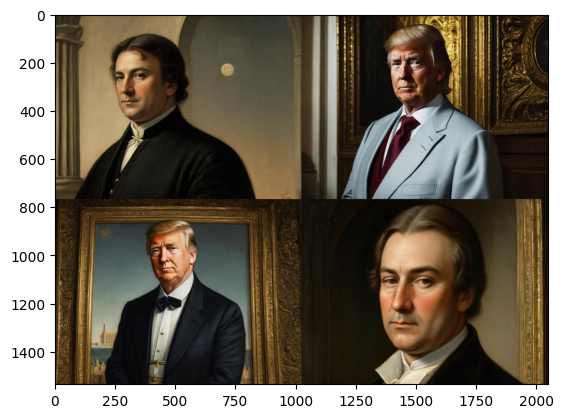

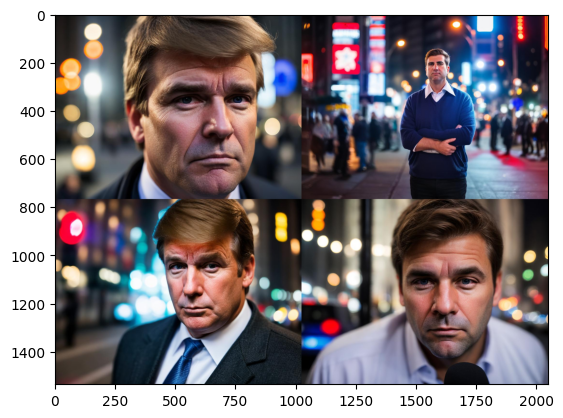

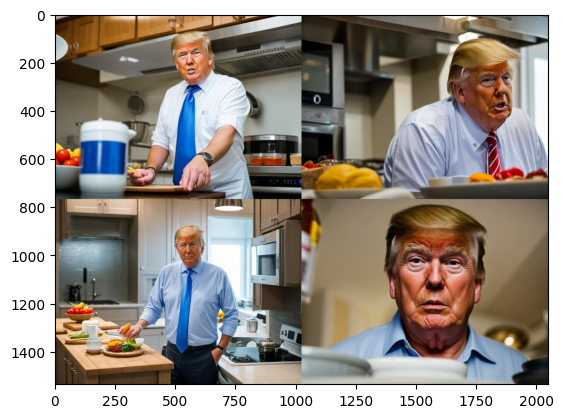

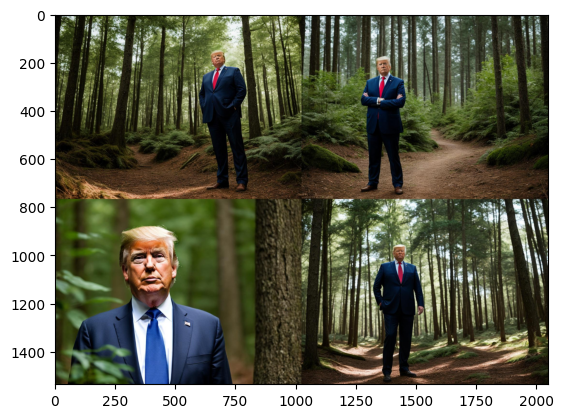

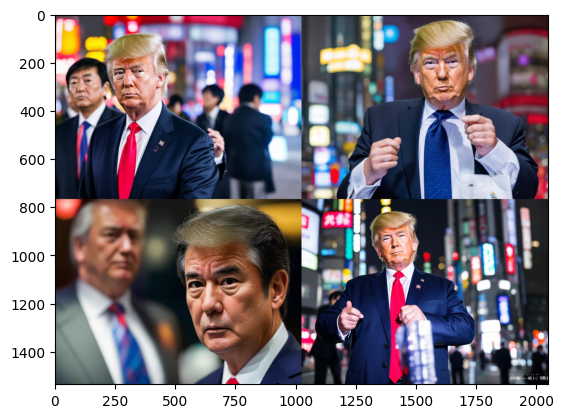

In [33]:
# Unet
folder = '/kaggle/working/output_pics_sd/with_train_token/768x1024'
pics = ['classicist art.jpg', 'street.jpg', 'kitchen.jpg', 'forest.jpg', 'anime.jpg']
for pic in pics:
    pic_path = os.path.join(folder, pic)
    img = mpimg.imread(pic_path)
    imgplot = plt.imshow(img)
    plt.show()

## ControlNet

In [ ]:
from diffusers.utils import load_image
image = load_image(
    "https://i.pinimg.com/originals/7a/a8/19/7aa819268de0d321ead4ead1e696dd45.jpg"
)
size = (340, 512)
image = image.resize(size)
image

if not os.path.exists('kaggle/working/controlnet'):
    os.makedirs('kaggle/working/controlnet')

save_folder = 'kaggle/working/controlnet'

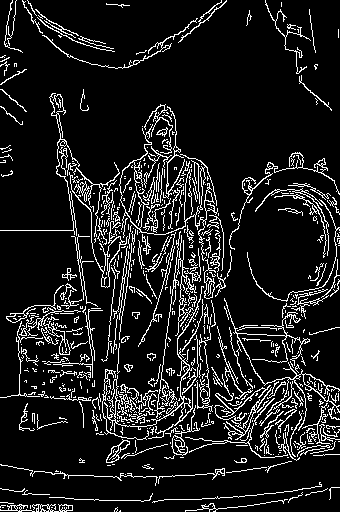

In [40]:
image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

In [44]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
num_samples = 2
repeat = 2

controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny",
                                             torch_dtype=torch.float16).to("cuda")

pipe = StableDiffusionControlNetPipeline.from_pretrained(model_path, safety_checker=None, controlnet=controlnet, torch_dtype=torch.float16).to("cuda")
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
g_cuda=None
save_mode = "with_train_token"
generator = torch.Generator("cuda").manual_seed(seed)
image_list = []
for _ in range(repeat):
    with autocast("cuda"), torch.inference_mode():
        images = pipe(
                'photo of man best quality, extremely detailed, 4k, hdr, super resolution',
                canny_image,
                height=height,
                width=width,
                negative_prompt='monochrome, lowres, bad anatomy, worst quality, low quality',
                num_images_per_prompt=num_samples,
                num_inference_steps=num_inference_steps,
                guidance_scale=guidance_scale,
                generator=generator
                ).images
        image_list.extend(images)
img_grid = image_grid(image_list, num_samples, repeat)
save_path = os.path.join(save_folder, save_mode, 'unet')
img_grid.save(os.path.join(save_path, "trump_napoleon.jpg"))

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/output_pics_sd/with_train_token/unet/trump_napoleon.jpg'